## intake + kerchunk

In [1]:
import intake

In [2]:
cat = intake.open_catalog("/home/datawork-lops-iaocea/catalog/intake/gulfstream_gigatl1_1h_tides.yaml")

ds = (
    cat["1h_tides"].to_dask()
)

In [3]:
ds

<xarray.Dataset>
Dimensions:   (time: 1464, s_w: 101, eta_rho: 841, xi_rho: 1576, s_rho: 100, xi_u: 1575, eta_v: 840)
Coordinates:
  * time      (time) datetime64[ns] 2008-08-01 ... 2008-09-30T23:00:00
Dimensions without coordinates: s_w, eta_rho, xi_rho, s_rho, xi_u, eta_v
Data variables: (12/14)
    AKv       (time, s_w, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 17, 141, 263), meta=np.ndarray>
    angle     (time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 841, 1576), meta=np.ndarray>
    f         (time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 841, 1576), meta=np.ndarray>
    h         (time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 841, 1576), meta=np.ndarray>
    lat_rho   (time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 841, 1576), meta=np.ndarray>
    lon_rho   (time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 841, 1576), meta=np.ndarray>
    ...        ...
    pn        (time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 841, 1576), meta=np.ndarray>
    salt      (time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 17, 141, 263), meta=np.ndarray>
    temp      (time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 17, 141, 263), meta=np.ndarray>
    u         (time, s_rho, eta_rho, xi_u) float32 dask.array<chunksize=(1, 17, 141, 263), meta=np.ndarray>
    v         (time, s_rho, eta_v, xi_rho) float32 dask.array<chunksize=(1, 17, 140, 263), meta=np.ndarray>
    zeta      (time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 421, 788), meta=np.ndarray>
Attributes: (12/69)
    Akt_bak:         [0.0, 0.0]
    Akt_bak_expl:    background vertical mixing coefficient for tracers
    Akt_bak_units:   meter2 second-1
    Akv_bak:         0.0
    Akv_bak_expl:    background vertical mixing coefficient for momentum
    Akv_bak_units:   meter2 second-1
    ...              ...
    tnu4:            0.0
    tnu4_expl:       biharmonic mixing coefficient for tracers
    type:            ROMS restart file
    units:           meter4 second-1
    v_sponge:        0.0
    x_sponge:        0.0

In [4]:
mask = ds.mask_rho.isel(time=0).load()
mask_psi = ds.mask_rho.isel(time=0,xi_rho=slice(0,-1),eta_rho=slice(0,-1)).swap_dims({"xi_rho": "xi_u"}).swap_dims({"eta_rho": "eta_v"}).load()

In [5]:
import numpy as np
import matplotlib.pyplot as plt
####
#temp=ds.TEMP.isel(time=).transpose('time','level', 'nj', 'ni').compute().data
#temp=ds.zeta.isel(time=slice(0,512,64)).transpose('time','eta_rho', 'xi_rho').where(mask).compute()
#ssh_lap = temp.diff(dim='xi_rho').diff(dim='eta_rho').compute()
####
u = ds.u.isel(time=slice(0,1464,128),s_rho=-1).transpose('time','eta_rho', 'xi_u')
v = ds.v.isel(time=slice(0,1464,128),s_rho=-1).transpose('time','eta_v', 'xi_rho')
vrt = v.diff(dim='xi_rho').swap_dims({"xi_rho": "xi_u"}) -  u.diff(dim='eta_rho').swap_dims({"eta_rho": "eta_v"})


In [6]:
temp = vrt.where(mask_psi).compute()

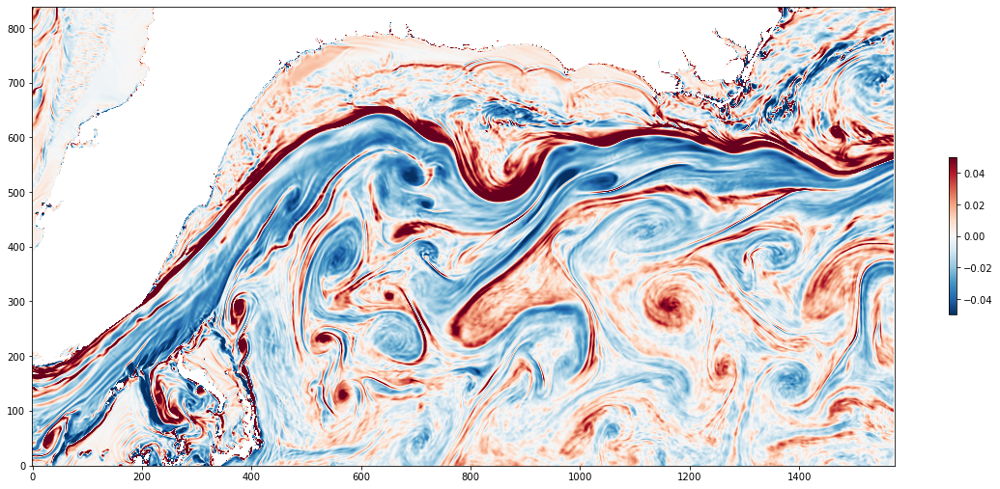

In [7]:
mycmap = 'RdBu_r'

f=plt.figure(figsize=(20,15))
plt.imshow(temp[0],origin='lower',vmin=-0.5e-1,vmax=0.5e-1,cmap=mycmap); 
plt.colorbar(shrink=0.2)


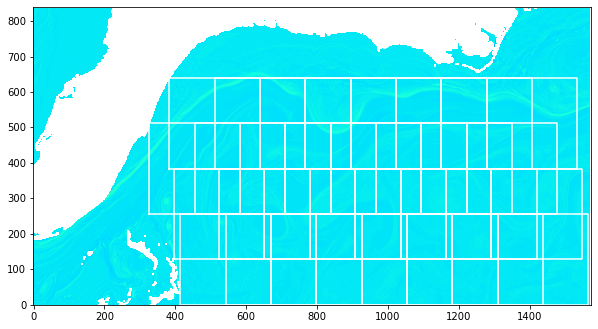

In [8]:

nt,nx,ny=temp.shape
histo=np.zeros([nx,ny])
XSIZE=64*4
for i in range(XSIZE):
    for j in range(XSIZE):
        histo[XSIZE//2:-XSIZE//2,XSIZE//2:-XSIZE//2]+=np.isnan(temp[0][i:nx-XSIZE+i,j:ny-XSIZE+j])==False

idx=np.zeros([2,nx*ny],dtype='int')
k=0
for i in range(nx):
    for j in range(ny):
        if histo[i,j]==XSIZE*XSIZE:
            histo[i-XSIZE//2:i+XSIZE//2,j-XSIZE//2:j+XSIZE//2]=0
            idx[0,k]=i
            idx[1,k]=j
            k=k+1
idx=idx[:,0:k]
f=plt.figure(figsize=(10,10))
plt.imshow(temp[0,:,:],cmap='jet',origin='lower')
for i in range(idx.shape[1]):
    plt.plot([idx[1][i]-XSIZE//2,idx[1][i]-XSIZE//2,idx[1][i]+XSIZE//2,idx[1][i]+XSIZE//2,idx[1][i]-XSIZE//2],
            [idx[0][i]-XSIZE//2,idx[0][i]+XSIZE//2,idx[0][i]+XSIZE//2,idx[0][i]-XSIZE//2,idx[0][i]-XSIZE//2],color='white')
    
nfield=idx.shape[1]
data=np.zeros([nfield*nt,XSIZE,XSIZE])
for j in range(nt):
    for i in range(nfield):
        data[j*nfield+i,:,:]=temp[j,idx[0,i]-XSIZE//2:idx[0,i]+XSIZE//2,idx[1,i]-XSIZE//2:idx[1,i]+XSIZE//2]
        data[j*nfield+i,:,:]-=data[j*nfield+i,:,:].mean()
        data[j*nfield+i,:,:]/=data[j*nfield+i,:,:].std()
        
nfield=nfield*nt

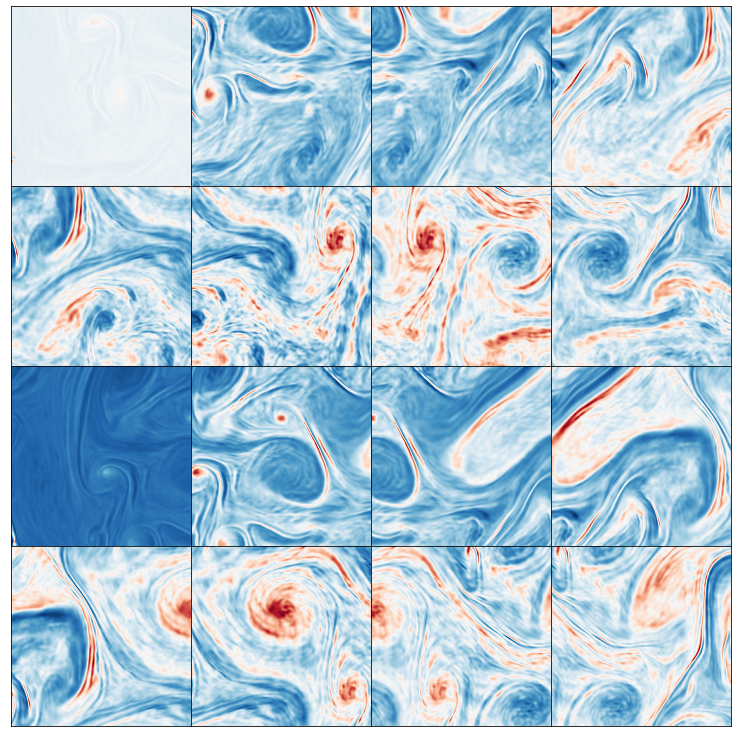

In [9]:
f=plt.figure(figsize=(10,10))
f.subplots_adjust(hspace=0.,wspace=0.,left=0.0,right=1.0,top=1.0,bottom=0.0)
for i in range(16):
    ax=plt.subplot(4,4,1+i)
    plt.imshow(data[i,:,:],cmap=mycmap,aspect='auto',origin='lower')
    ax.set_yticks([])
    ax.set_xticks([])
    
new_temp=data.reshape(nfield,XSIZE*XSIZE)

# DEFINE 2D SCATTERING FUNCTION

In [36]:
def scatter_wave(x,norient=8,doplot=False):
    nx,ny=x.shape
    n2data=int(np.log(nx)/np.log(2))
    nstep=n2data-1
    print('NSTEP ',nstep)
    val={}
    
    if doplot:
        f=plt.figure(figsize=(16,16))
        f.subplots_adjust(hspace=0.,wspace=0.,left=0.0,right=1.0,top=1.0,bottom=0.0)
        
    for i in range(nstep):
        xsize=2**(n2data-i)
        print(xsize)
        xx=np.repeat(np.roll(np.arange(xsize)-xsize/2,xsize//2)/(xsize/2),xsize).reshape(xsize,xsize)
        yy=xx.T
        ang=np.arctan2(yy,xx)
        
        for j in range(norient):
            a=np.pi/norient*j
            #val[i,j]=np.exp(-8*((xx*np.cos(a)+yy*np.sin(a)-2**(-i-1))**2+(xx*np.sin(a)-yy*np.cos(a))**2))
            val[i,j]=(xx**2+yy**2)*np.exp(-(xx**2+yy**2))*(np.exp(-4*(ang+a)**2)+np.exp(-4*(ang+a-2*np.pi)**2))
            val[i,j][0,0]=0.0
            
            if doplot:
                ax=plt.subplot(nstep,norient,1+i*norient+j)
                plt.imshow(val[i,j],cmap='jet',aspect='auto',origin='lower')
                ax.set_yticks([])
                ax.set_xticks([])
            
    return(val)
    
def scatter2D(x,val,norient=8,doplot=False,norm=False):
    nx,ny=x.shape
    
    tf=np.roll(np.roll(np.fft.fft2(x),nx//2,0),nx//2,1)
    
    n2data=int(np.log(nx)/np.log(2))
    nstep=n2data-1
    
    s1=np.zeros([nstep,norient])
    nn=norient*(nstep)
    s2=np.zeros([nstep*norient*nn])
    j1=np.zeros([nstep*norient*nn],dtype='int')
    j2=np.zeros([nstep*norient*nn],dtype='int')
    o1=np.zeros([nstep*norient*nn],dtype='int')
    o2=np.zeros([nstep*norient*nn],dtype='int')
    
    nn=0
    if doplot:
        f=plt.figure(figsize=(16,16))
        f.subplots_adjust(hspace=0.,wspace=0.,left=0.0,right=1.0,top=1.0,bottom=0.0)
        
    for i in range(nstep):
        nnn=2**(n2data-i)
        tf2=2**(-i)*np.roll(np.roll(tf[nx//2-nnn//2:nx//2+nnn//2,nx//2-nnn//2:nx//2+nnn//2],-nnn//2,0),-nnn//2,1)
        for j in range(norient):
            tmp=abs(np.fft.ifft2(tf2*val[i,j]))       
            
            if doplot:
                ax=plt.subplot(nstep,norient,1+i*norient+j)
                plt.imshow(tmp,cmap='jet',aspect='auto',origin='lower')
                ax.set_yticks([])
                ax.set_xticks([])
            s1[i,j]=tmp[nnn//4:-nnn//4,nnn//4:-nnn//4].mean()
                    
            ltf2=np.fft.fft2(tmp)
            for k in range(nstep-i-1):
                nnn2=2**(n2data-i-k-1)
                tf3=np.roll(np.roll(ltf2[nnn//2-nnn2//2:nnn//2+nnn2//2,nnn//2-nnn2//2:nnn//2+nnn2//2],-nnn2//2,0),-nnn2//2,1)
                for l in range(norient):
                    tmp2=abs(np.fft.ifft2(val[k+i+1,(j+l)%norient]*tf3))
                    j1[nn]=i
                    j2[nn]=k+i+1
                    o1[nn]=j
                    o2[nn]=(j+l)%norient
                    s2[nn]=tmp2[nnn2//4:-nnn2//4,nnn2//4:-nnn2//4].mean()
                    nn+=1
        
    s2=s2[0:nn]
    j1=j1[0:nn]
    j2=j2[0:nn]
    o1=o1[0:nn]
    o2=o2[0:nn]
    
    if norm==True:
        s1=np.mean(s1,1)
        ws2=np.bincount((j2-j1-1)*norient+(o2-o1+norient)%norient,weights=s2)
        ns2=np.bincount((j2-j1-1)*norient+(o2-o1+norient)%norient)
        s2=ws2/ns2
        return(s1,s2)
    else:
        return(s1.flatten(),s2.flatten()) #,j1,j2,o1,o2)

In [37]:
val=scatter_wave(data[0,:,:])
s1,s2=scatter2D(data[0,:,:],val,norm=False)
n1=s1.shape[0]
n2=s2.shape[0]
n=n1+n2

scat=np.zeros([nfield,n])
nb=0
for i in range(nfield):
    if i>(nb*nfield)//100:
        print("%2d %% Done"%(nb))
        nb+=5
    s1,s2=scatter2D(data[i,:,:],val,norm=False)
    scat[i,0:n1]=s1.flatten()
    scat[i,n1:]=s2.flatten()
    

NSTEP  7
256
128
64
32
16
8
4
 0 % Done
 5 % Done
10 % Done
15 % Done
20 % Done
25 % Done
30 % Done
35 % Done
40 % Done
45 % Done
50 % Done
55 % Done
60 % Done
65 % Done
70 % Done
75 % Done
80 % Done
85 % Done
90 % Done
95 % Done


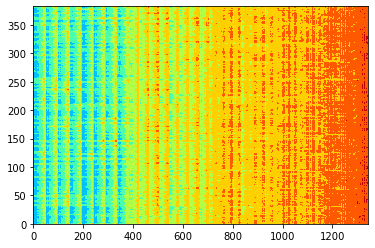

In [38]:
plt.contourf(np.log(scat[:,n1:]),cmap='jet')

In [39]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

ncluster=4

acp = PCA(n_components=2)
y=acp.fit_transform(np.log(scat[:,n1:]))

kmeans = KMeans(init="random",n_clusters=ncluster,n_init=10,max_iter=300,random_state=42)
kmeans.fit(y)


KMeans(init='random', n_clusters=4, random_state=42)

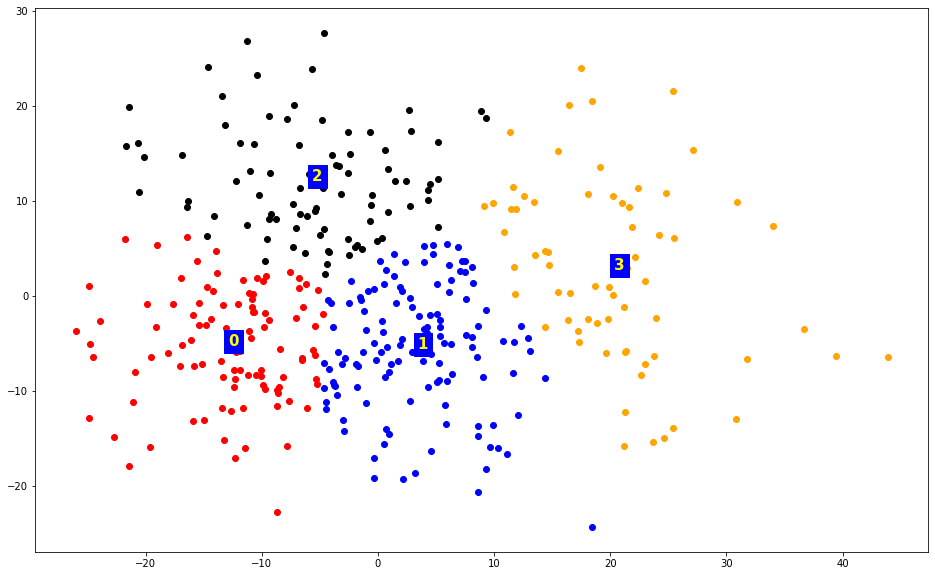

In [40]:
color=['red','blue','black','orange','yellow','purple','darkblue','darkred','pink','grey','Gainsboro']
plt.figure(figsize=(16,10))
for i in range(ncluster):
    plt.scatter(y[kmeans.labels_==i,0],y[kmeans.labels_==i,1],color=color[i])
    plt.text(y[kmeans.labels_==i,0].mean(),y[kmeans.labels_==i,1].mean(),'%d'%(i),fontsize=15,fontweight='bold',backgroundcolor='blue',color='yellow')

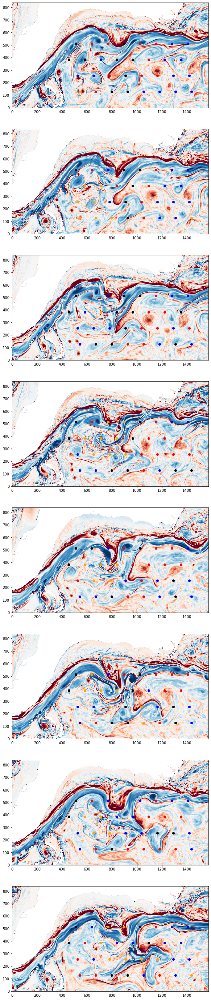

In [41]:
###########################

nx = idx.shape[1]

plt.figure(figsize=(16,50))

for j in range(8):
    ax = plt.subplot(8,1,j+1)
    plt.imshow(temp[j,:,:],origin='lower',vmin=-0.5e-1,vmax=0.5e-1,cmap=mycmap); 
    
    for i in range(nx*j,nx*(j+1)):
        plt.plot(idx[1][i%nx],idx[0][i%nx],'o',color=color[kmeans.labels_[i]])
    
    


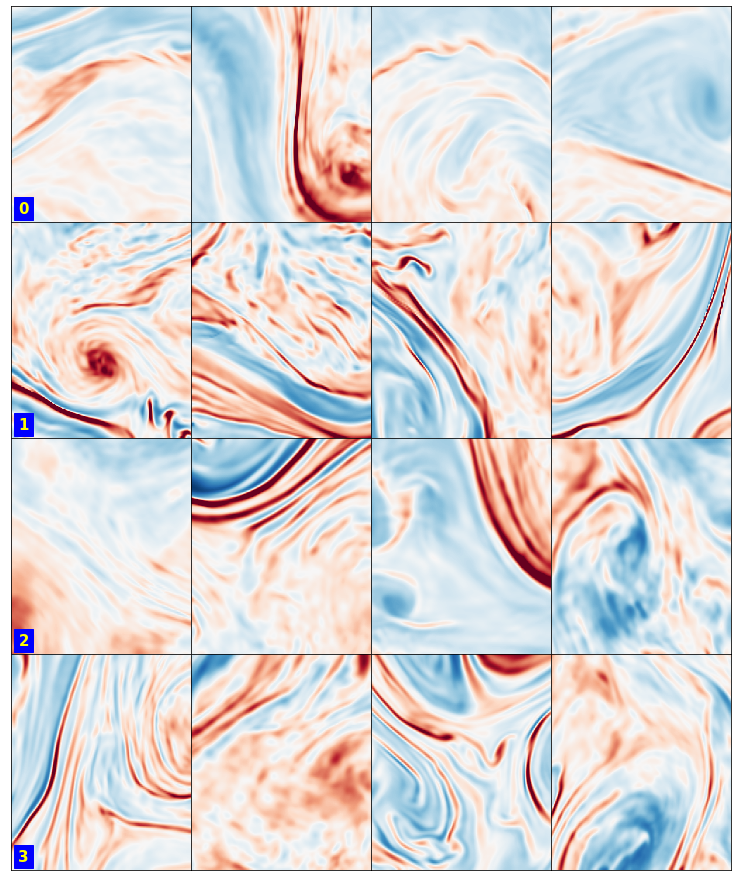

In [17]:
f=plt.figure(figsize=(10,12))
f.subplots_adjust(hspace=0.,wspace=0.,left=0.0,right=1.0,top=1.0,bottom=0.0)
for i in range(ncluster):
    x0=y[kmeans.labels_==i,0].mean()
    y0=y[kmeans.labels_==i,1].mean()
    iii=np.argsort((y[:,0]-x0)**2+(y[:,1]-y0)**2)
    for j in range(4):
        ax=plt.subplot(ncluster,4,1+4*i+j)
        plt.imshow(data[iii[j]][XSIZE//4:-XSIZE//4,XSIZE//4:-XSIZE//4],cmap=mycmap,aspect='auto',origin='lower',vmin=-3.,vmax=3.)
        ax.set_yticks([])
        ax.set_xticks([])
        if j==0:
            plt.text(5,5,'%d'%(i),fontsize=15,fontweight='bold',backgroundcolor='blue',color='yellow')

In [52]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

ncluster=6

acp = TSNE(n_components=2)
y=acp.fit_transform(np.log(scat[:,8:]))

kmeans = KMeans(init="random",n_clusters=ncluster,n_init=1,max_iter=300,random_state=42)
kmeans.fit(y)


/home/datawork-lops-iaocea/conda-env/cpu/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/datawork-lops-iaocea/conda-env/cpu/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


KMeans(init='random', n_clusters=6, n_init=1, random_state=42)

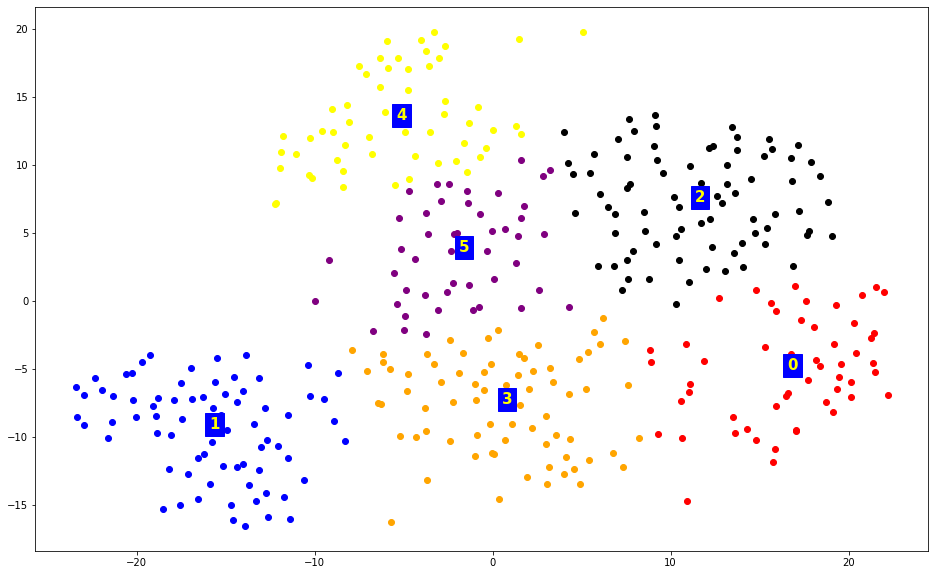

In [53]:

plt.figure(figsize=(16,10))
for i in range(ncluster):
    plt.scatter(y[kmeans.labels_==i,0],y[kmeans.labels_==i,1],color=color[i])
    plt.text(y[kmeans.labels_==i,0].mean(),y[kmeans.labels_==i,1].mean(),'%d'%(i),fontsize=15,fontweight='bold',backgroundcolor='blue',color='yellow')

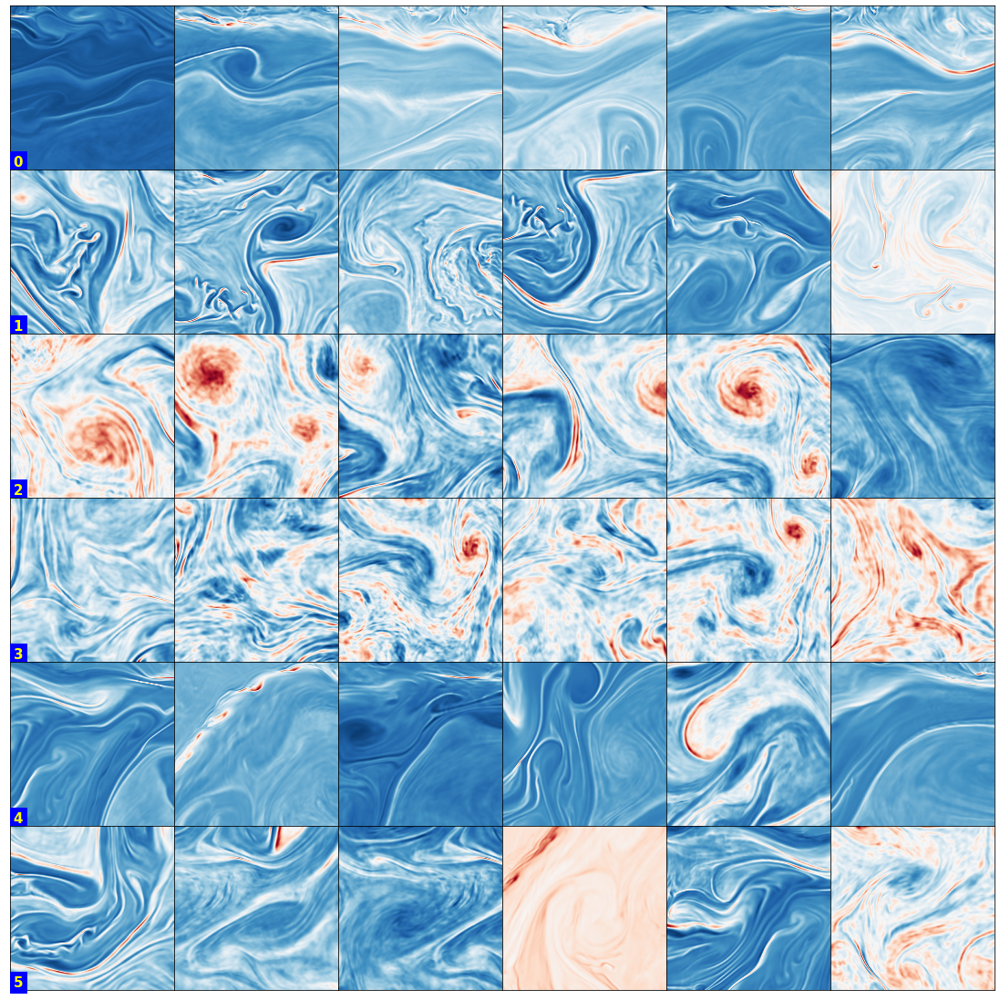

In [54]:
f=plt.figure(figsize=(15,15))
f.subplots_adjust(hspace=0.,wspace=0.,left=0.0,right=1.0,top=1.0,bottom=0.0)
for i in range(ncluster):
    x0=y[kmeans.labels_==i,0].mean()
    y0=y[kmeans.labels_==i,1].mean()
    iii=np.argsort((y[:,0]-x0)**2+(y[:,1]-y0)**2)
    for j in range(6):
        ax=plt.subplot(ncluster,6,1+6*i+j)
        plt.imshow(data[iii[j]][:,:],cmap=mycmap,aspect='auto',origin='lower')
        ax.set_yticks([])
        ax.set_xticks([])
        if j==0:
            plt.text(5,5,'%d'%(i),fontsize=15,fontweight='bold',backgroundcolor='blue',color='yellow')

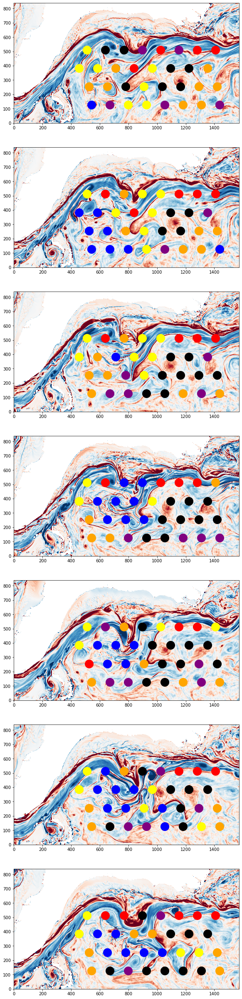

In [55]:
###########################

nx = idx.shape[1]

plt.figure(figsize=(16,50))

for j in range(7):
    ax = plt.subplot(8,1,j+1)
    plt.imshow(temp[j,:,:],origin='lower',vmin=-0.5e-1,vmax=0.5e-1,cmap=mycmap); 
    
    for i in range(nx*j,nx*(j+1)):
        #if kmeans.labels_[i]==2:
        plt.plot(idx[1][i%nx],idx[0][i%nx],'o',markersize=20,color=color[kmeans.labels_[i]])
    
    
